# **SVD and FFT Compression and Denoising**

### **Convert RGB to Gray-scale and compressing the images**

In [ ]:
# Importing libraries:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import warnings
warnings.filterwarnings("ignore")

In [ ]:
# A function for converting RGB image to Gray-scale image:
def RGB_to_Gray(filename):
  img = Image.open(filename)
  img = img.convert('LA')
  return img

# ------------------------------------------------------------------------------
# A function to convert the image data into a numpy matrix:
def Img_to_Mat(img):
  img_mat = np.array(list(img.getdata(band = 0)), float)
  img_mat.shape = (img.size[0], img.size[1])
  img_mat = np.matrix(img_mat)
  return img_mat

# ------------------------------------------------------------------------------
# A function for SVD image compression:
def SVD_Compressor(img_mat, ratio):
  U, S, V = np.linalg.svd(img_mat)
  tau = int(np.ceil(ratio/100*img_mat.shape[0]))
  compressed_img = np.matmul(np.matmul(U[:, :tau] , np.diag(S[:tau])) , V[:tau, :])
  return compressed_img

# ------------------------------------------------------------------------------
# A function for FFT compression:
def FFT_Compressor(img_mat, ratio):
  fft_img = np.fft.fft2(img_mat)
  sorted_fft = np.sort(np.abs(fft_img.reshape(-1)))  # sort matrix values by magnitude
  thr = sorted_fft[int(np.floor((1-ratio/100)*len(sorted_fft)))]  # set a threshold to remove small coefficients
  indxs = np.abs(fft_img)>thr
  compressed_fft = fft_img * indxs
  compressed_img = np.fft.ifft2(compressed_fft).real
  return compressed_img

# ------------------------------------------------------------------------------
# A function for implementing the SVD compressing algorithm:
def SVD_Compressing(filename, ratios):
  img = RGB_to_Gray(filename)
  img_mat = Img_to_Mat(img)

  fig, axs = plt.subplots(len(ratios),1,figsize = (20,20))
  for i in range(len(ratios)):
    compressed_img = SVD_Compressor(img_mat, ratios[i])
    print(type(compressed_img))
    axs[i].imshow(compressed_img, cmap = 'gray')
    axs[i].set_title('Compression Ratio = {:.2f}'.format(ratios[i])+'%')
    axs[i].axis('off')

# ------------------------------------------------------------------------------
# A function for implementing the FFT compressing algorithm:
def FFT_Compressing(filename, ratios):
  img = RGB_to_Gray(filename)
  img_mat = Img_to_Mat(img)

  fig, axs = plt.subplots(len(ratios),1,figsize = (20,20))
  for i in range(len(ratios)):
    compressed_img = FFT_Compressor(img_mat, ratios[i])
    # print(type(compressed_img))
    axs[i].imshow(compressed_img, cmap = 'gray')
    axs[i].set_title('Compression Ratio = {:.2f}'.format(ratios[i])+'%')
    axs[i].axis('off')  

# ------------------------------------------------------------------------------
# A function for showing the compressed images with both algorithms:
def Show_Compressions(filename, ratios):
  img = RGB_to_Gray(filename)
  img_mat = Img_to_Mat(img)

  for r in ratios:
    fig, axs = plt.subplots(1, 2, figsize = (10,10))
    svd_compressed_img = SVD_Compressor(img_mat, r)
    axs[0].imshow(svd_compressed_img, cmap = 'gray')
    axs[0].set_title('SVD Compression Ratio = {:.2f}'.format(r)+'%')
    axs[0].axis('off')
    fft_compressed_img = FFT_Compressor(img_mat, r)
    axs[1].imshow(fft_compressed_img, cmap = 'gray')
    axs[1].set_title('FFT Compression Ratio = {:.2f}'.format(r)+'%')
    axs[1].axis('off')

**Run both algorithms for all images:**

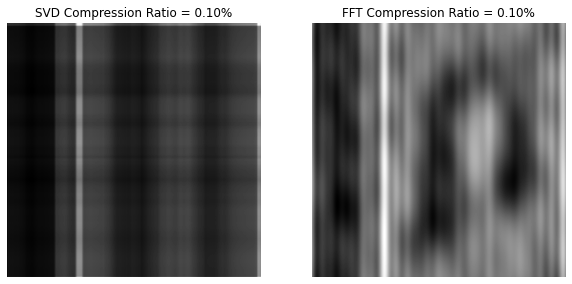

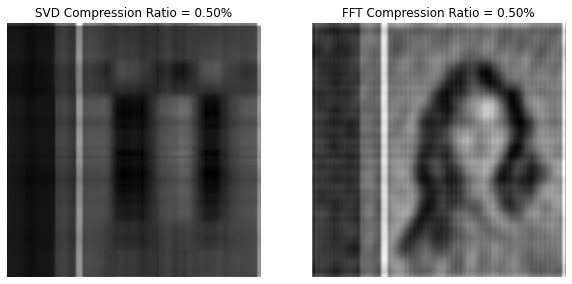

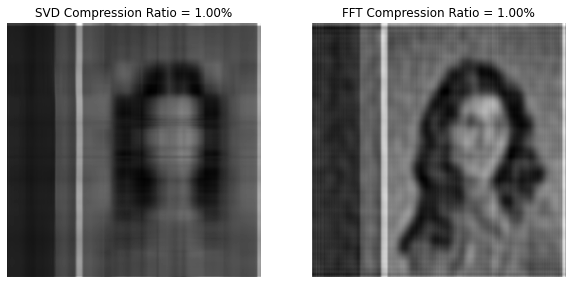

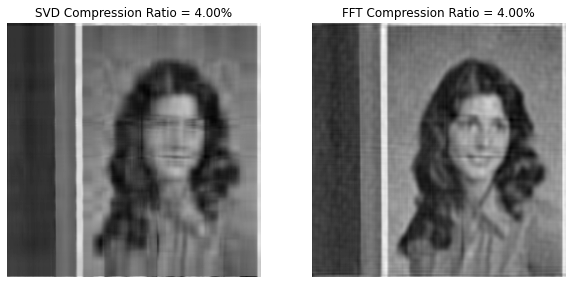

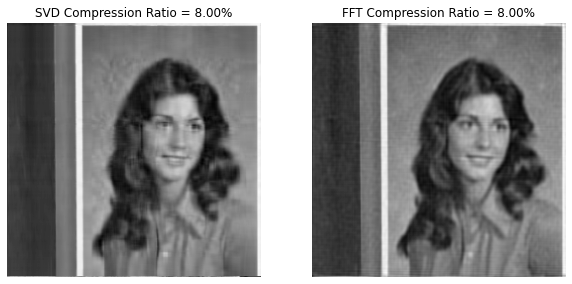

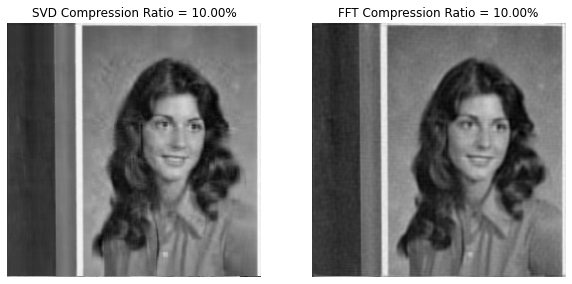

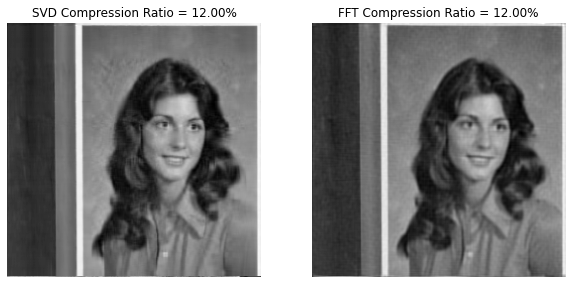

In [ ]:
ratios = [0.1, 0.5, 1, 4, 8, 10, 12]
# image 1:
Show_Compressions('1.tiff', ratios)

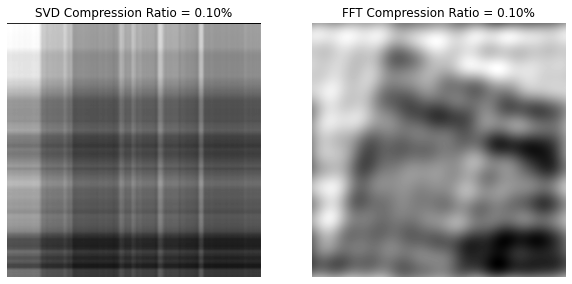

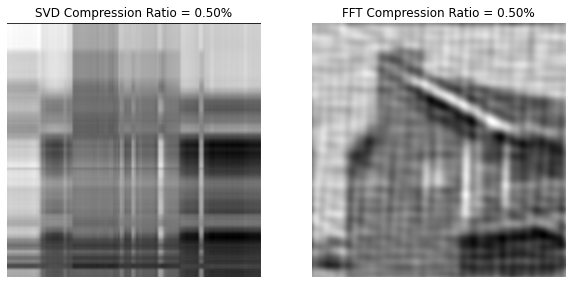

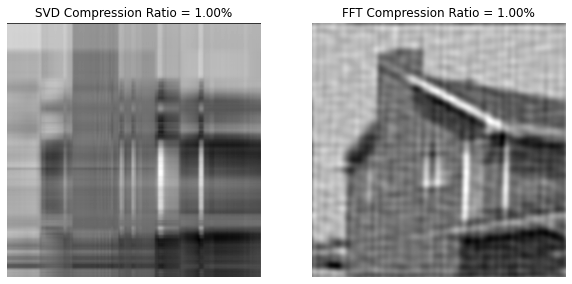

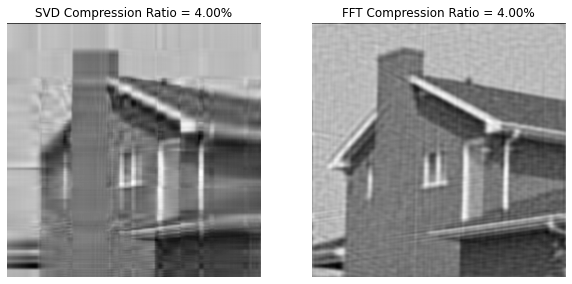

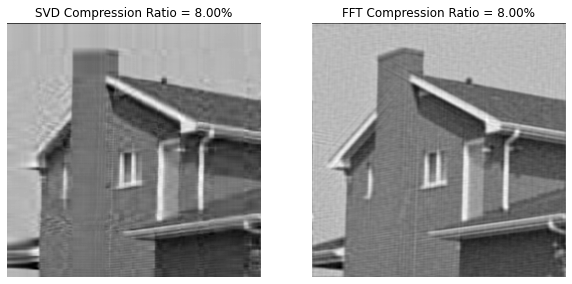

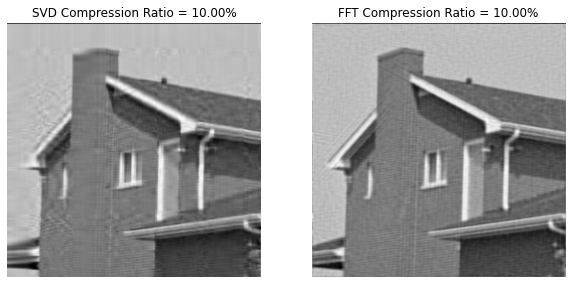

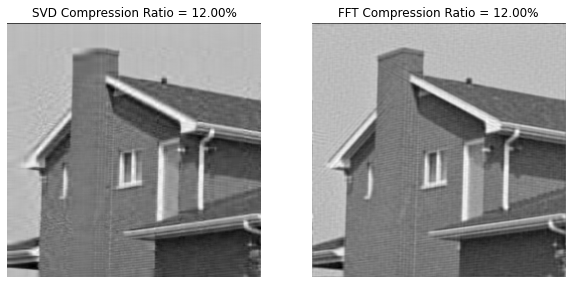

In [ ]:
# image 2:
Show_Compressions('2.tiff', ratios)

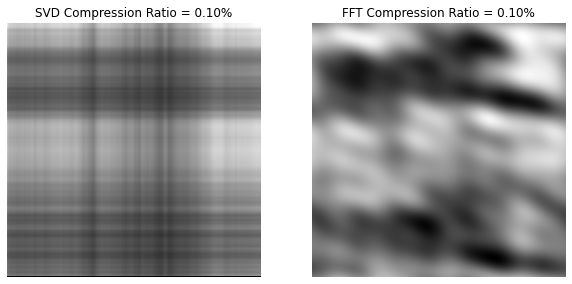

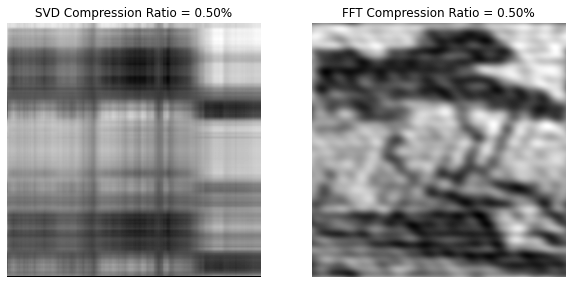

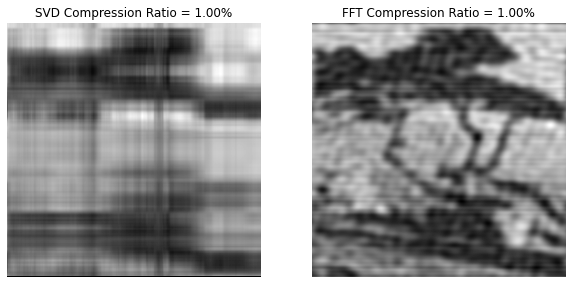

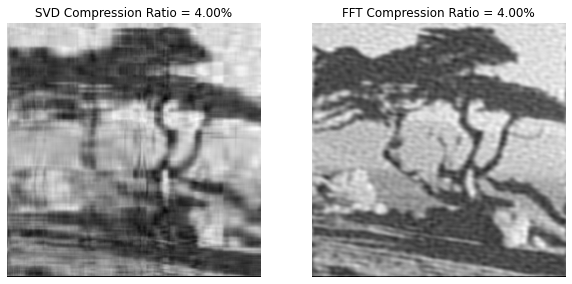

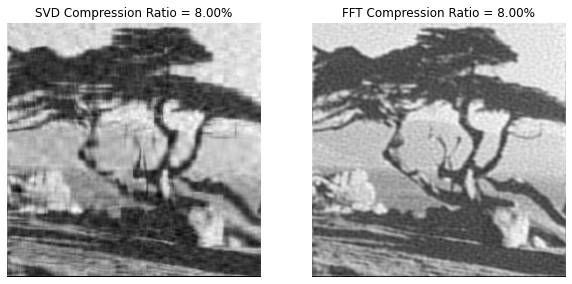

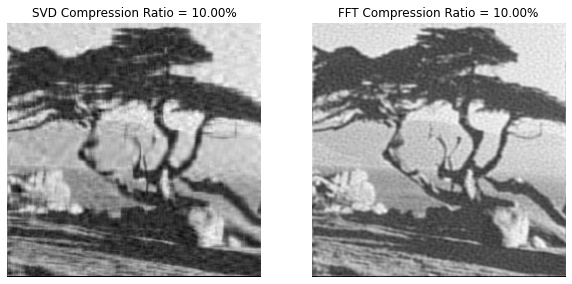

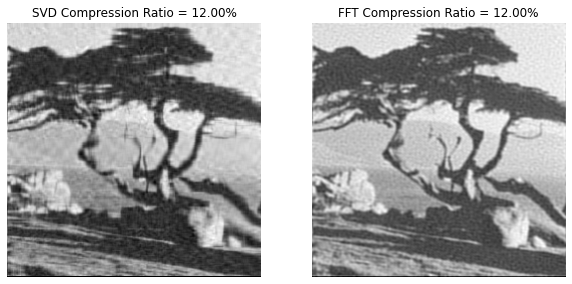

In [ ]:
# image 3:
Show_Compressions('3.tiff', ratios)

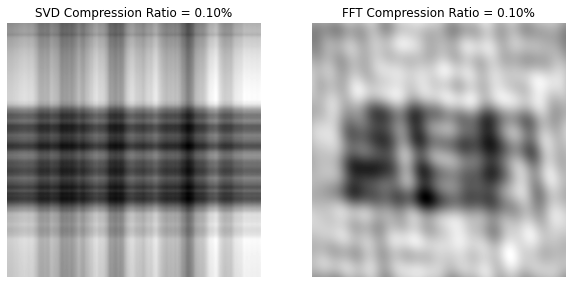

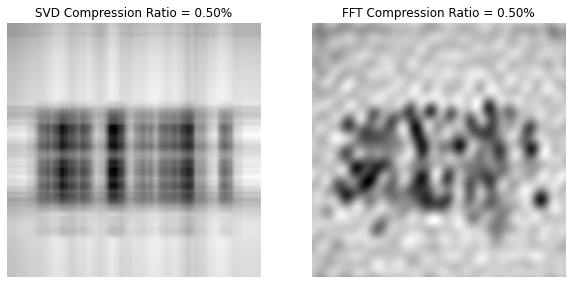

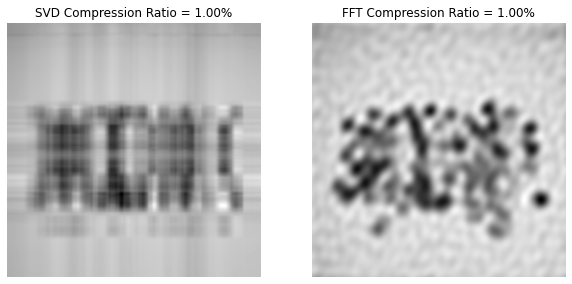

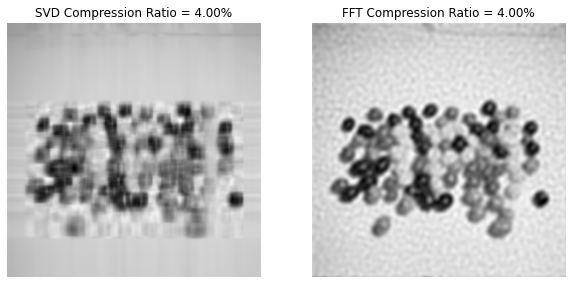

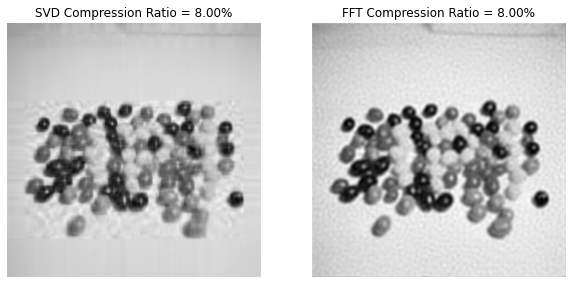

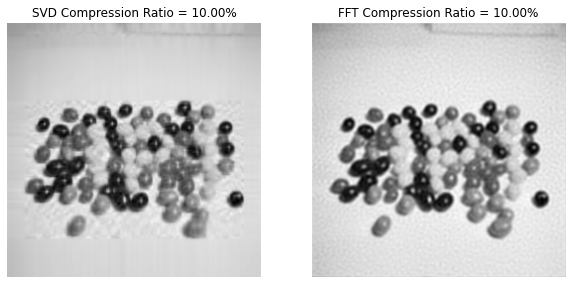

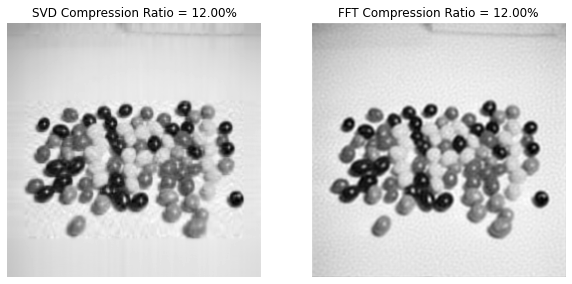

In [ ]:
# image 4:
Show_Compressions('4.tiff', ratios)

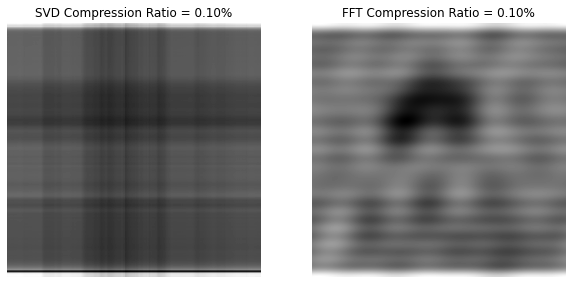

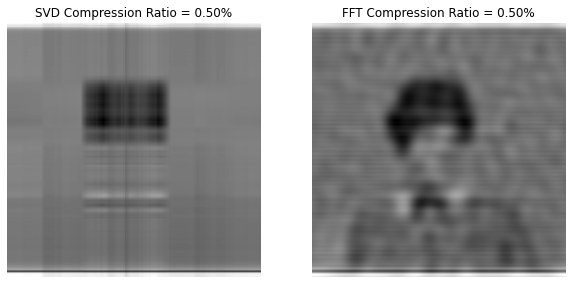

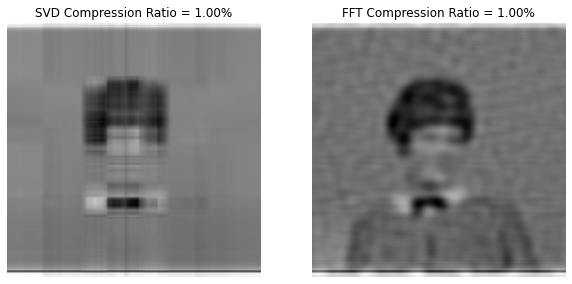

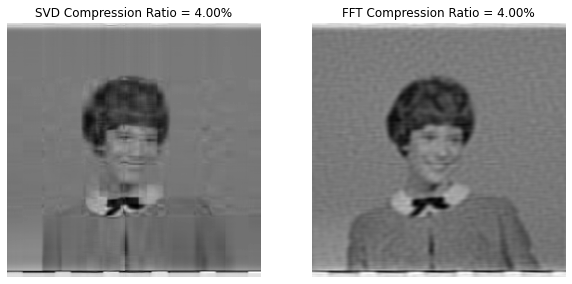

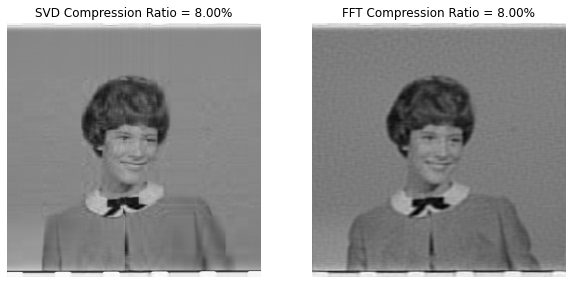

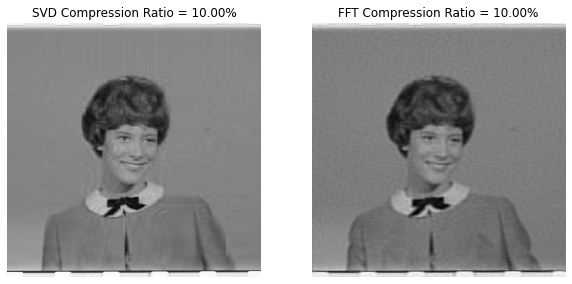

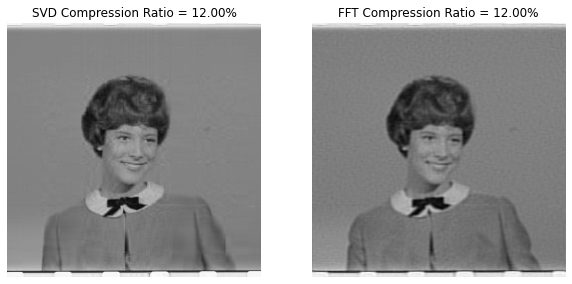

In [ ]:
# image 5:
Show_Compressions('5.tiff', ratios)

### **Implementations for RGB images**

In [ ]:
# A function for RGB image compressing with SVD method:
def RGB_SVD_Compressor(filename, ratio):
  img = Image.open(filename)
  img = np.asarray(img)
  compressed_img = np.zeros(img.shape)

  for rgb in range(img.shape[2]):
    compressed_img[:,:,rgb] = SVD_Compressor(img[:,:,rgb], ratio)  
  
  for ind1, row in enumerate(compressed_img):
    for ind2, col in enumerate(row):
      for ind3, value in enumerate(col):
        if value < 0:
          compressed_img[ind1,ind2,ind3] = abs(value)
        if value > 255:
          compressed_img[ind1,ind2,ind3] = 255
  return compressed_img.astype(np.uint8)

# ------------------------------------------------------------------------------
# A function for RGB image compression with FFT method:
def RGB_FFT_Compressor(filename, ratio):
  img = Image.open(filename)
  img = np.asarray(img)
  compressed_img = np.zeros(img.shape)
  # compressed_img = img.copy()

  for rgb in range(img.shape[2]):
    compressed_img[:,:,rgb] = FFT_Compressor(img[:,:,rgb], ratio)

  for ind1, row in enumerate(compressed_img):
    for ind2, col in enumerate(row):
      for ind3, value in enumerate(col):
        if value < 0:
          compressed_img[ind1,ind2,ind3] = abs(value)
        if value > 255:
          compressed_img[ind1,ind2,ind3] = 255  
  return compressed_img.astype(np.uint8)

# ------------------------------------------------------------------------------
# # A function for RGB image compression with PCA method:
# def RGB_PCA_Compressor(filename, ratio):
#   img = Image.open(filename)
#   img = np.asarray(img)
#   compressed_img = img.copy()

#   for rgb in range(img.shape[2]):
#     img_layer = img[:,:,rgb]
#     img_layer = img_layer.reshape((img_layer.shape[0], img_layer.shape[1]**2)) #flattening the image 
#     img_layer = img_layer - np.average(img_layer, axis=0) # make each channel zero centered
#     cov_mat = np.cov(img_layer, rowvar = False)   # calculating covariance matrix
#     evals, evecs = np.linalg.eig(cov_mat)  # eigen values and eigen vectors for covariance matrix 
#     sorted_index = np.argsort(evals)[::-1]   # sorting the eigen values and vectors in descending order
#     sorted_evals = evals[sorted_index]
#     sorted_evecs = evecs[:,sorted_index]
#     PCs = sorted_evecs[:, :int(np.ceil(ratio/100*sorted_evecs.shape[1]))]
#     compressed_img[:,:,rgb] = np.dot(PCs.T, img_layer.T).T
#   return compressed_img

# ------------------------------------------------------------------------------
# A function for showing the compressed RGB images with both algorithms:
def Show_RGB_Compressions(filename, ratios):
  for r in ratios:
    fig, axs = plt.subplots(1, 2, figsize = (10,10))
    svd_compressed_img = RGB_SVD_Compressor(filename, r)
    axs[0].imshow(svd_compressed_img)
    axs[0].set_title('SVD Compression Ratio (RGB image) = {:.2f}'.format(r)+'%')
    axs[0].axis('off')
    fft_compressed_img = RGB_FFT_Compressor(filename, r)
    # pca_compressed_img = RGB_PCA_Compressor(filename, r)
    axs[1].imshow(fft_compressed_img)
    axs[1].set_title('FFT Compression Ratio (RGB image) = {:.2f}'.format(r)+'%')
    axs[1].axis('off')

**Run both algorithms for all images:**

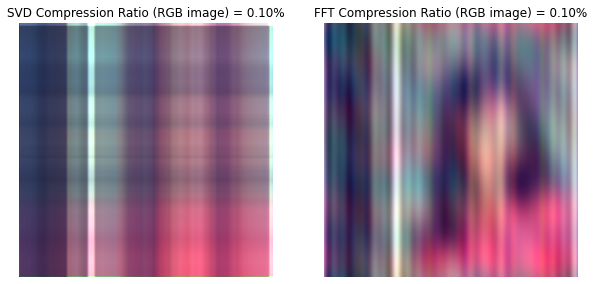

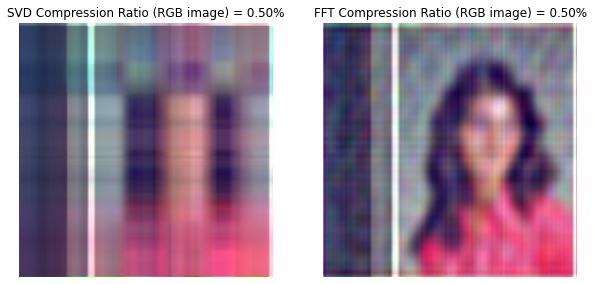

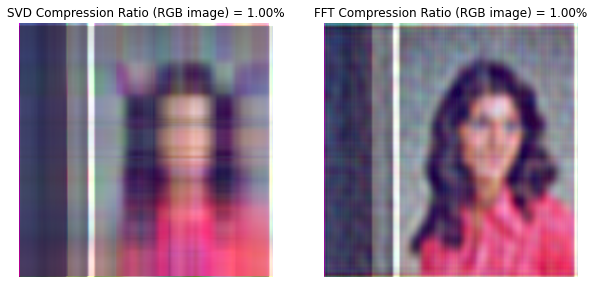

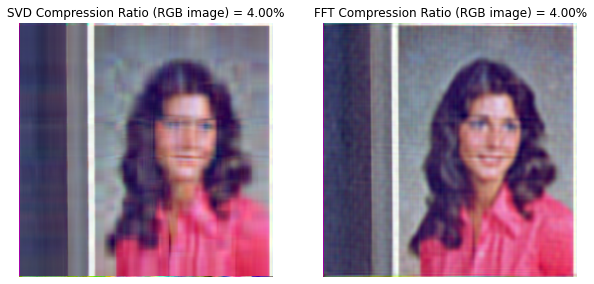

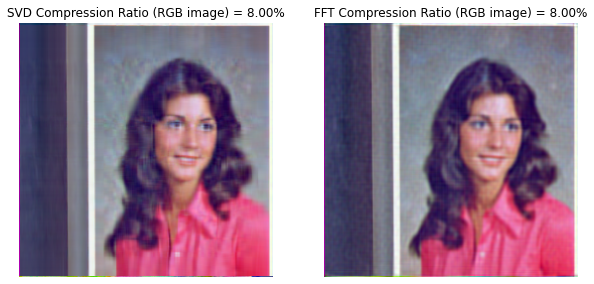

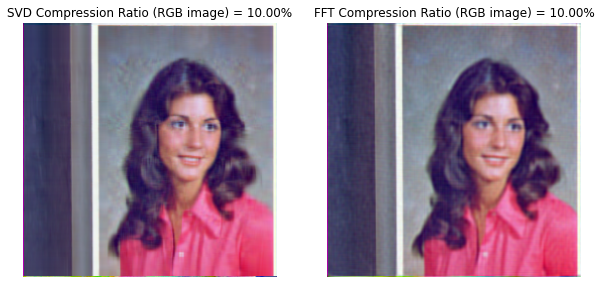

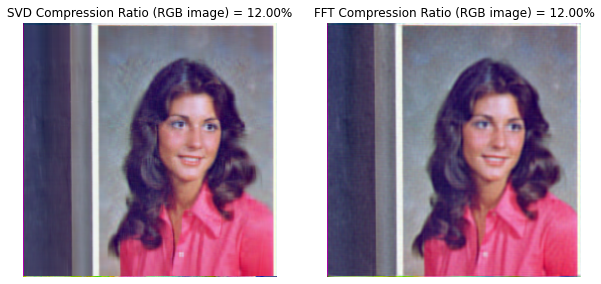

In [ ]:
ratios = [0.1, 0.5, 1, 4, 8, 10, 12]
# image 1:
Show_RGB_Compressions('1.tiff', ratios)

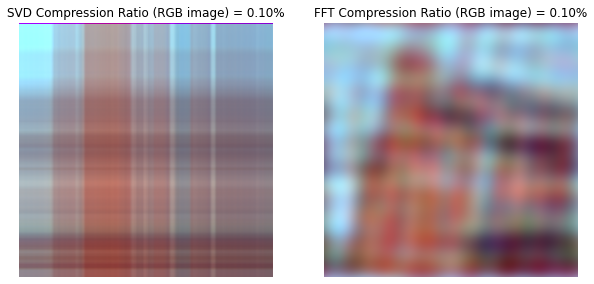

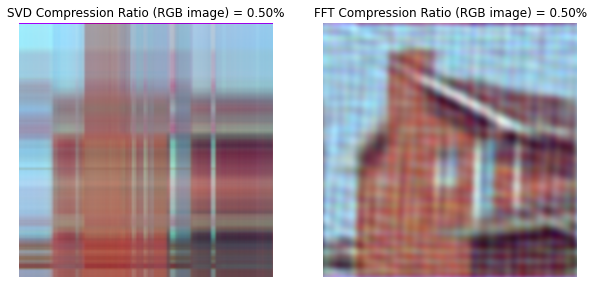

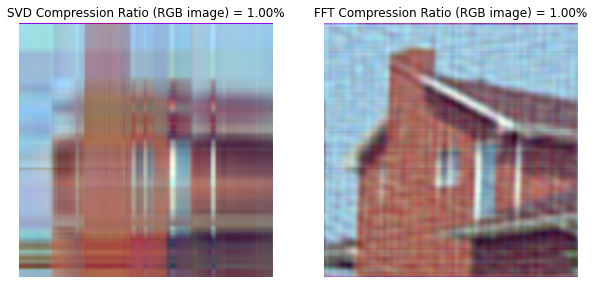

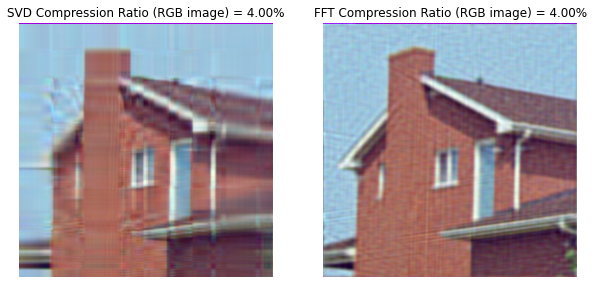

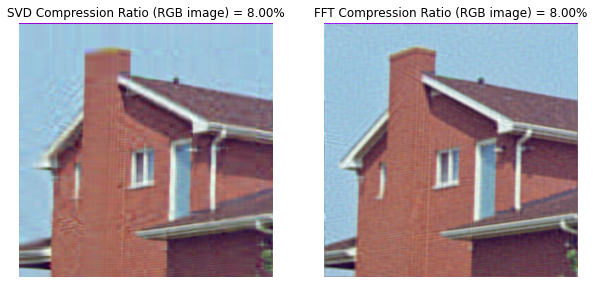

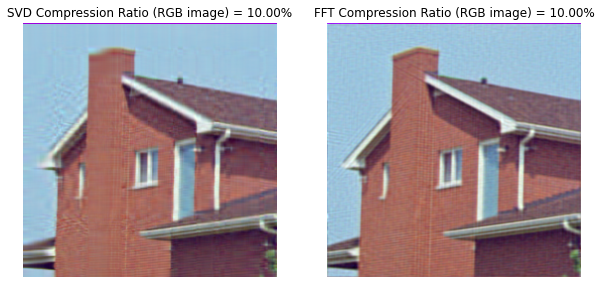

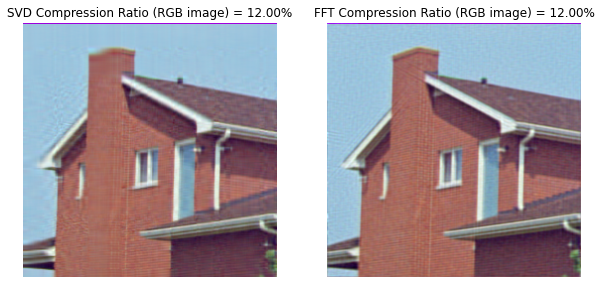

In [ ]:
# image 2:
Show_RGB_Compressions('2.tiff', ratios)

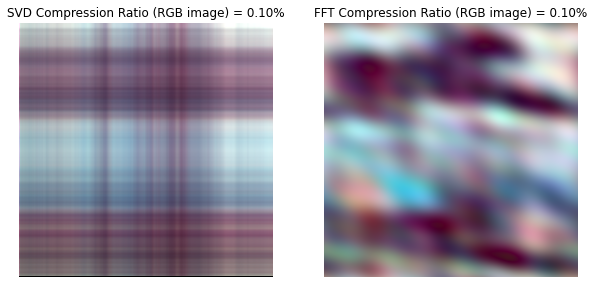

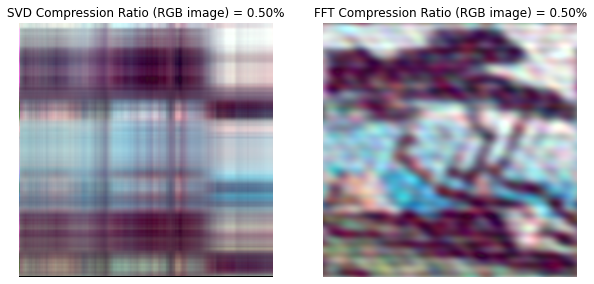

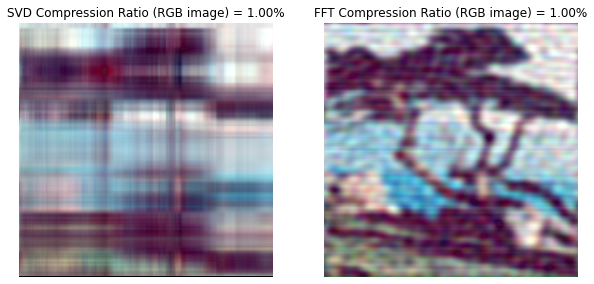

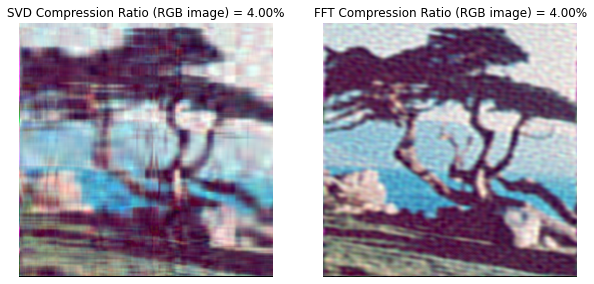

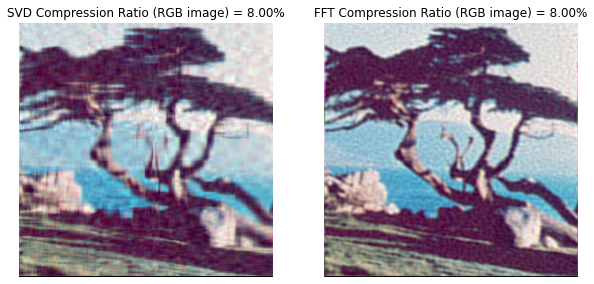

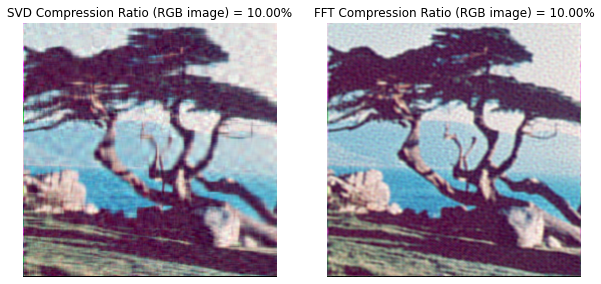

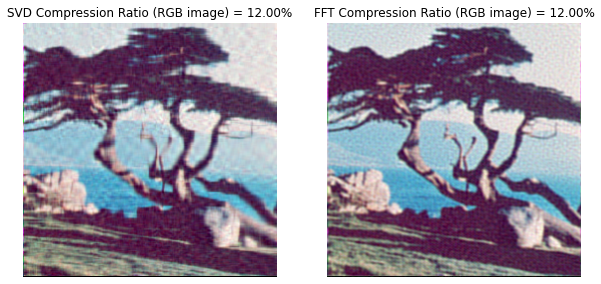

In [ ]:
# image 3:
Show_RGB_Compressions('3.tiff', ratios)

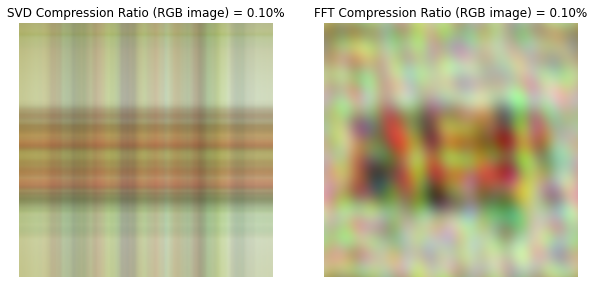

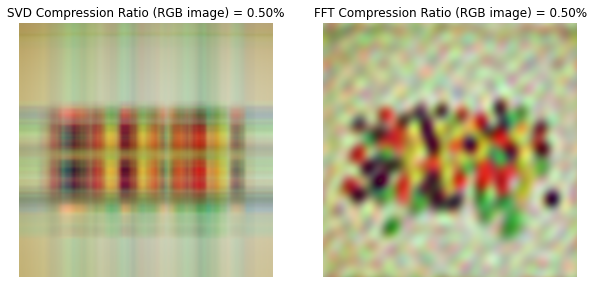

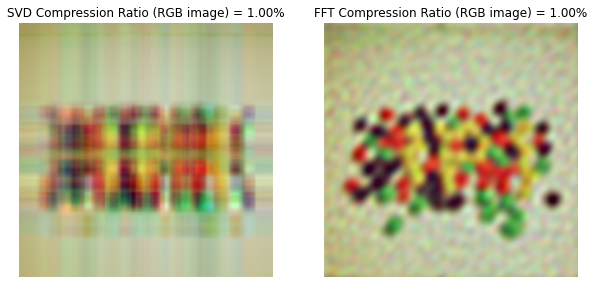

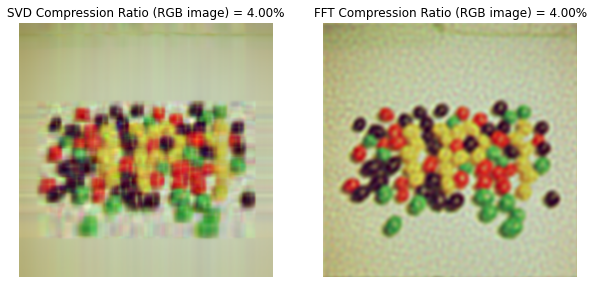

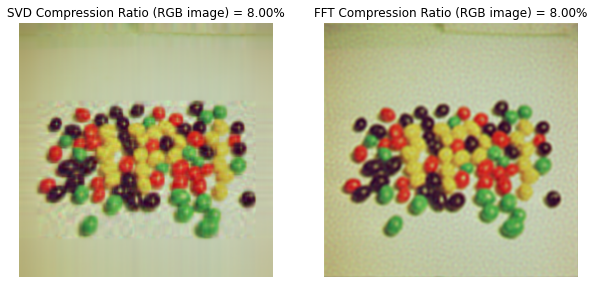

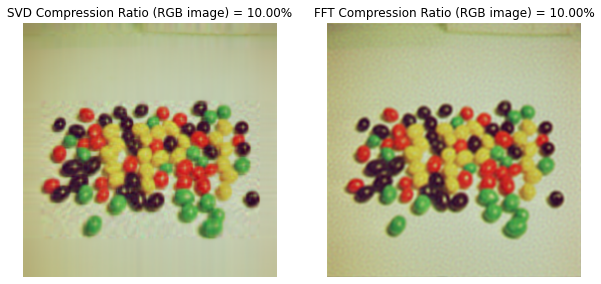

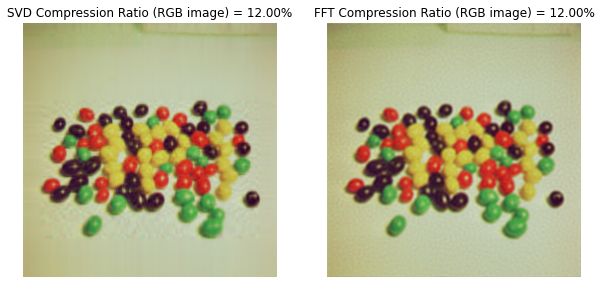

In [ ]:
# image 4:
Show_RGB_Compressions('4.tiff', ratios)

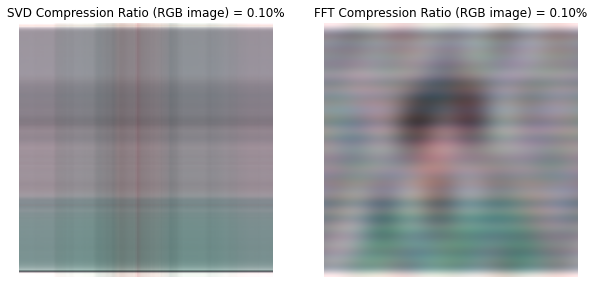

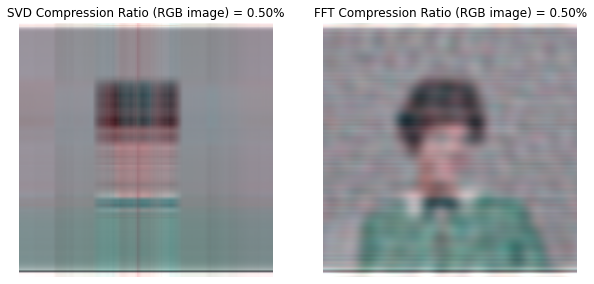

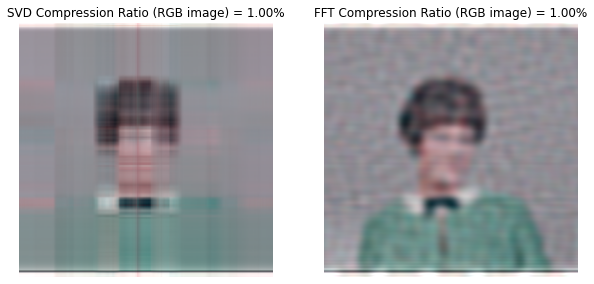

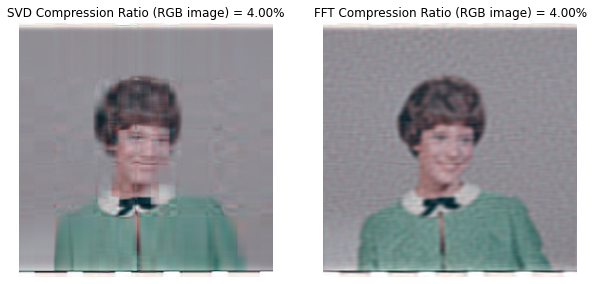

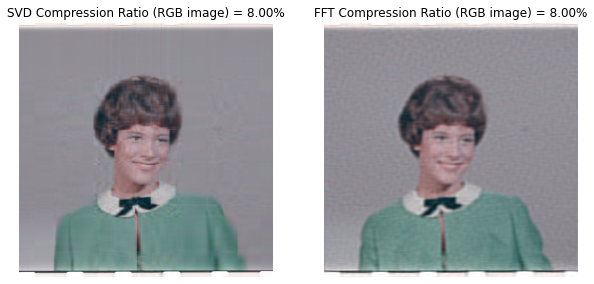

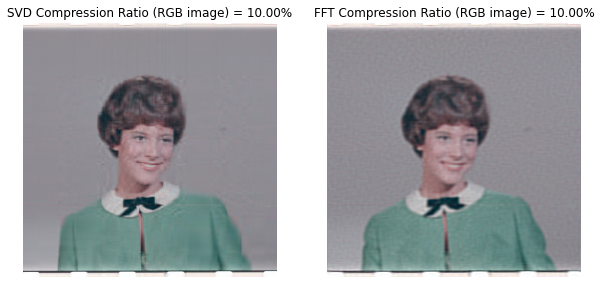

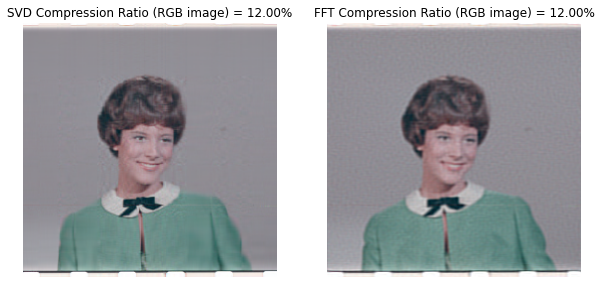

In [ ]:
# image 5:
Show_RGB_Compressions('5.tiff', ratios)

### **Denoising images with SVD**

In [ ]:
def SVD_Denoise(filename, rank):
  img = Image.open(filename)
  img = np.asarray(img)
  denoised_img = np.zeros(img.shape)
  for rgb in range(img.shape[2]):
    U, S, V = np.linalg.svd(img[:,:,rgb])
    denoised_img[:,:,rgb] = np.matmul(np.matmul(U[:, :rank] , np.diag(S[:rank])) , V[:rank, :])

  for ind1, row in enumerate(denoised_img):
    for ind2, col in enumerate(row):
      for ind3, value in enumerate(col):
        if value < 0:
          denoised_img[ind1,ind2,ind3] = abs(value)
        if value > 255:
          denoised_img[ind1,ind2,ind3] = 255  
  return denoised_img.astype(np.uint8)

### **Denoising images with FFT**

In [ ]:
def FFT_Denoise(filename, r):
  img = Image.open(filename)
  img = np.asarray(img)
  denoised_img = np.zeros(img.shape)

  for rgb in range(img.shape[2]):
    fft_img = np.fft.fft2(img[:,:,rgb])
    rows, cols = fft_img.shape
    fft_img[int(rows*r):int(rows*(1-r)),:] = 0
    fft_img[:, int(cols*r):int(cols*(1-r))] = 0
    denoised_img[:,:,rgb] = np.fft.ifft2(fft_img).real

  for ind1, row in enumerate(denoised_img):
    for ind2, col in enumerate(row):
      for ind3, value in enumerate(col):
        if value < 0:
          denoised_img[ind1,ind2,ind3] = abs(value)
        if value > 255:
          denoised_img[ind1,ind2,ind3] = 255  
  return denoised_img.astype(np.uint8)

### **Denoising all images with both algorithms**

In [ ]:
# A function for showing denoised images with SVD method:
def SVD_Denoising(filename, ranks):
  fig, axs = plt.subplots(2,3,figsize = (10,10))
  img = Image.open(filename)
  img = np.asarray(img)
  ax = plt.subplot(2,3,1)
  ax.imshow(img)
  ax.set_title('Noisy image')
  ax.axis('off')
  for i in range(len(ranks)):
    denoised_img = SVD_Denoise(filename, ranks[i])
    ax = plt.subplot(2,3,i+2)
    ax.imshow(denoised_img)
    ax.set_title('SVD denoising with rank '+str(ranks[i]))
    ax.axis('off')

# ------------------------------------------------------------------------------
# A function for showing denoised images with FFT method:
def FFT_Denoising(filename, radiuses):
  fig, axs = plt.subplots(2,3,figsize = (10,10))
  img = Image.open(filename)
  img = np.asarray(img)
  ax = plt.subplot(2,3,1)
  ax.imshow(img)
  ax.set_title('Noisy image')
  ax.axis('off')
  for i in range(len(radiuses)):
    denoised_img = FFT_Denoise(filename, radiuses[i])
    ax = plt.subplot(2,3,i+2)
    ax.imshow(denoised_img)
    ax.set_title('FFT denoising with radius '+str(radiuses[i]))
    ax.axis('off')

In [ ]:
ranks = [50, 80, 100, 120, 150]
radiuses = [0.25, 0.35, 0.4, 0.45, 0.49]

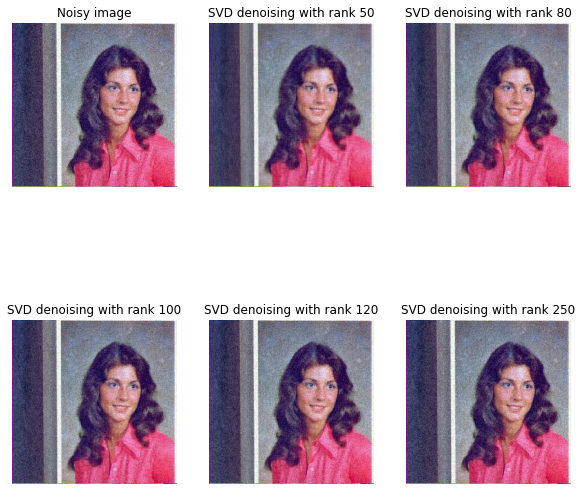

In [ ]:
# image 1:
SVD_Denoising('1.jpeg', ranks)

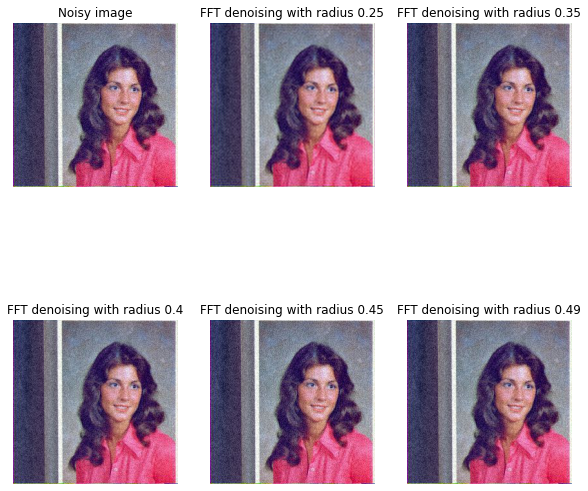

In [ ]:
# image 1:
FFT_Denoising('1.jpeg', radiuses)

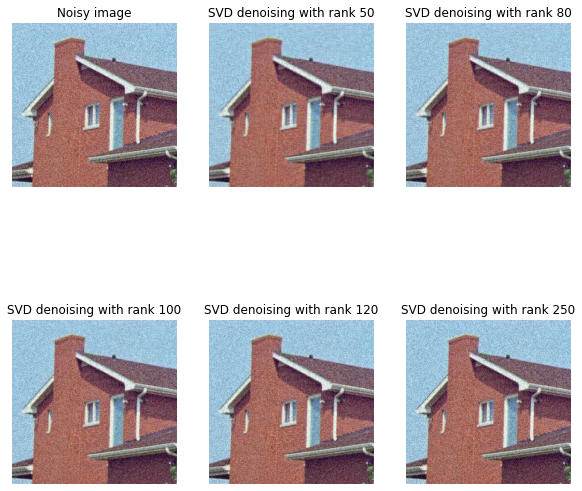

In [ ]:
# image 2:
SVD_Denoising('2.jpeg', ranks)

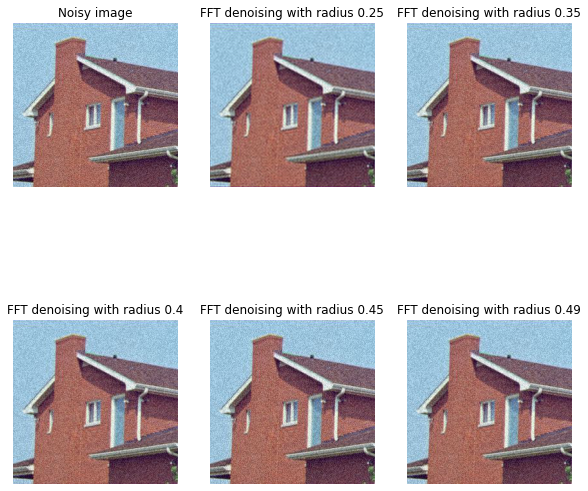

In [ ]:
# image 2:
FFT_Denoising('2.jpeg', radiuses)

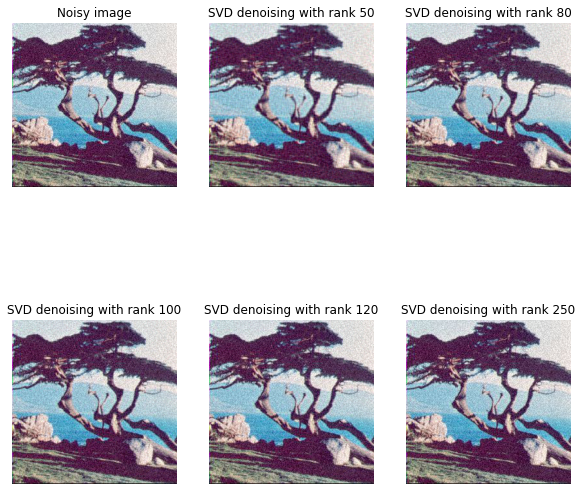

In [ ]:
# image 3:
SVD_Denoising('3.jpeg', ranks)

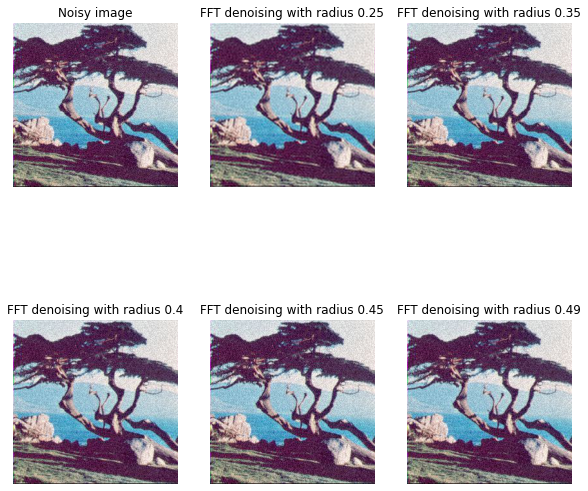

In [ ]:
# image 3:
FFT_Denoising('3.jpeg', radiuses)

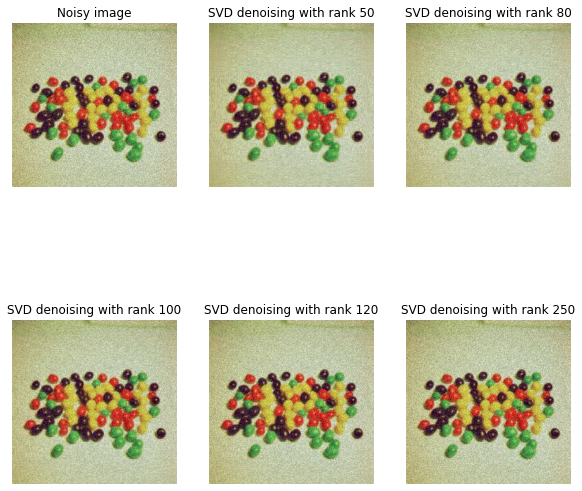

In [ ]:
# image 4:
SVD_Denoising('4.jpeg', ranks)

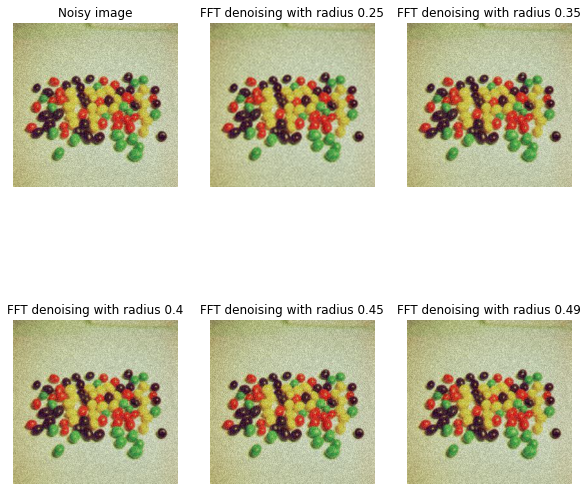

In [ ]:
# image 4:
FFT_Denoising('4.jpeg', radiuses)

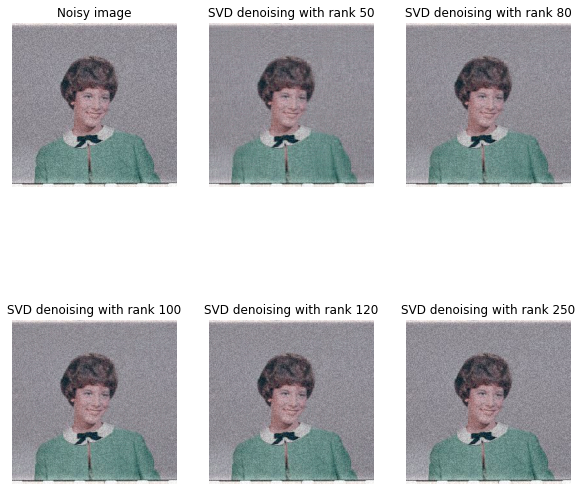

In [ ]:
# image 5:
SVD_Denoising('5.jpeg', ranks)

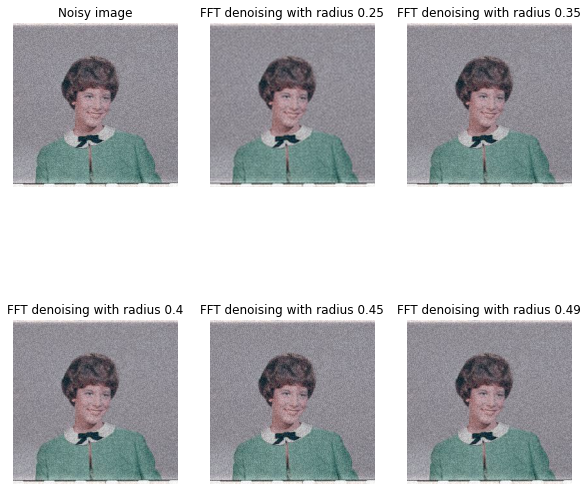

In [ ]:
# image 5:
FFT_Denoising('5.jpeg', radiuses)